# KMeans Clustering Analysis for California Housing Data


## Table of Contents
<div>
<table border="5">
<tr>
<th>Title</th>
</tr>
<tr>
<td>Objective</td>
</tr>
<tr>
<td>Data Description</td>
</tr>
<tr>
<td>Importing Dataset</td>
</tr>
<tr>
<td>Finding Optimal K Value</td>
</tr>
<tr>
<td>Cluster Analysis</td>
</tr>
<tr>
<td>Standardizing Data</td>
</tr>
<tr>
<td>Conclusion</td>
</tr>
</table>
</div>

## Objective
Use the California Housing dataset to implement KMeans clustering technique to understand the clusters, analyse the features of cluster.

## Data Description
Use the California Housing dataset to perform exploratory data analysis and predict housing prices using a Linear Regression model from the sklearn library. Investigate how various hyperparameters affect the model's performance.

| Column title       | Description                                                                                                  | Range               | Datatype |
|--------------------|--------------------------------------------------------------------------------------------------------------|----------------------|----------|
| Longitude          | A measure of how far west a house is; a more negative value is farther west                                 | -180 to +180         | float64  |
| Latitude           | A measure of how far north a house is; a higher value is farther north                                       | -90 to +90           | float64  |
| HouseAge   | Median age of a house within a block; a lower number is a newer building                                      | 1.0 to 52.0          | float64  |
| AveRooms         | Average number of rooms within a block                                                                         | 0.846154 to 141.909091       | float64  |
| AveBedrms      | Average number of bedrooms within a block                                                                     | 0.333333 to 34.066667        | float64  |
| Population         | Total number of people residing within a block                                                              | 3.0 to 35682.0       | float64  |
| AveOccup         | Average number of households, a group of people residing within a home unit, for a block                       | 0.692308 to 1243.333333        | float64  |
| MedInc       | Median income for households within a block of houses (measured in tens of thousands of US Dollars)          | 0.5 to 15.0          | float64  |
| MedHouseVal  | Median house value for households within a block (measured in US Dollars)                                    | 0.14999 to 5.000010 | float64  |


### Importing Libraries

In [97]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

### Importing Dataset

In [98]:
california_housing = pd.DataFrame(fetch_california_housing(as_frame=True).frame)
columns = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup',
       'Latitude', 'Longitude', 'MedHouseVal']

### Finding Optimal k for clustering

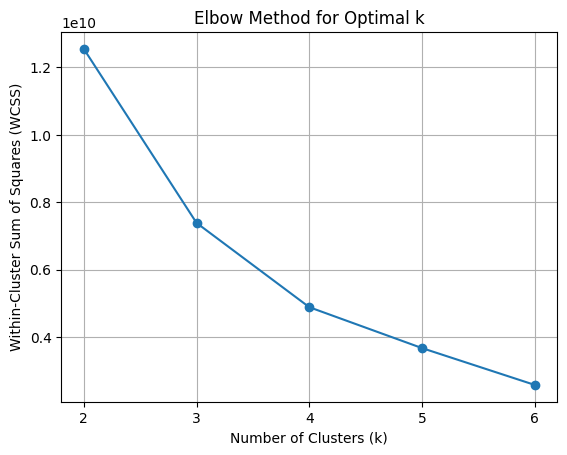

slope for k = 2 is -5161970737.736476
slope for k = 3 is -2499857923.5630484
slope for k = 4 is -1213680071.251193
slope for k = 5 is -1092712293.8884397


In [99]:
# Define the range of k values
k_values = range(2,7)
x =[]
y = []

# Compute WCSS for each k
wcss = []
for k in k_values:
    x.append(k)
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(california_housing)
    wcss.append(kmeans.inertia_)
    y.append(kmeans.inertia_)

# Plot WCSS against k
plt.plot(k_values, wcss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal k')
plt.xticks(k_values)
plt.grid(True)
plt.show()

slope = []

for i in range(0,len(x)-1):
    slope.append((y[i+1]-y[i])/(x[i+1]-x[i]))

for i in range(0,len(slope)):
    print(f"slope for k = {i+2} is {slope[i]}")

#### Inference
Here, we can see that the slope of Line k2 - k3 and k3 - k4 is having a high reduction and the following line slopes are gradual and this denotes k=3 could be a optimal value for clustering.

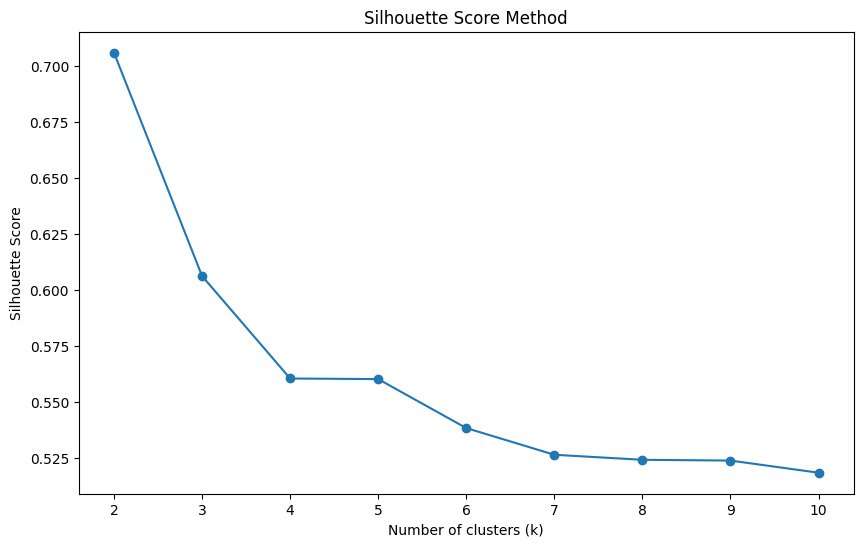

Optimal number of clusters: 2


In [100]:
X = california_housing

# Calculating silhouette scores for different values of k
silhouette_scores = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X)
    labels = kmeans.labels_
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

# Plotting silhouette scores
plt.figure(figsize=(10, 6))

plt.plot(K, silhouette_scores, marker='o')
plt.title('Silhouette Score Method')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

# Find the optimal k
optimal_k = K[np.argmax(silhouette_scores)]
print(f'Optimal number of clusters: {optimal_k}')


- From the above method of finding optimal cluster number using silhouette analysis, we got **k = 2** as optimal cluster. 
- Whereas, from the elbow method has we can see that k=3 is having more impact Intra-cluster distance.  
  
So, we proceed with analysing the clusters based on the cluster analysis to find the optimal cluster number.

### Cluster Analysis

##### Visualizing Functions

In [101]:
def visualizeKMeans(X, n_clusters):
    # Standardizing the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Applying PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    
    # Fitting K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(X_pca)
    
    # Create a mesh grid for plotting decision boundaries
    h = .02  # step size of the mesh
    x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
    y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    
    # Obtain labels for each point in mesh using the trained model
    Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Define a colormap
    cmap = ListedColormap(['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#00FFFF', '#FF00FF', '#808080', '#800000', '#008080', '#800080'])
    
    # Plotting the decision boundaries
    plt.figure(figsize=(12, 8))
    plt.contourf(xx, yy, Z, cmap=cmap, alpha=0.3)
    
    # Plotting the points and centroids
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_, cmap=cmap, edgecolor='k', s=50)
    centroids = kmeans.cluster_centers_
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=200, c='blue', edgecolor='k', lw=3)
    
    # Annotate centroids
    for i, centroid in enumerate(centroids):
        plt.annotate(f'Centroid {i+1}', (centroid[0], centroid[1]), textcoords="offset points", xytext=(0,10), ha='center', fontsize=12, fontweight='bold', color='blue')
    
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title(f'PCA with K-means Clustering (k={n_clusters})')
    plt.show()

def facetPlot(data,numerical_vars):
    melted_data = pd.melt(data, id_vars=['Cluster'], value_vars=numerical_vars,
                      var_name='measurement', value_name='value')
    g = sns.FacetGrid(melted_data, col='measurement', hue='Cluster', col_wrap=3, sharex=False, sharey=False)
    g.map(sns.histplot, 'value', kde=True, bins=15, alpha=0.6).add_legend()
    g.fig.suptitle('Histograms of California Housing data by cluster', y=1.03)
    plt.show()

def pairPlot(data):
    sns.pairplot(data, hue="Cluster")

#### k=2

In [102]:
kmeans = KMeans(n_clusters=2, init='k-means++', random_state=42)
kmeans.fit(california_housing)
y_pred = kmeans.predict(california_housing)
cluster_california = california_housing.assign(Cluster = y_pred)
print(cluster_california["Cluster"].value_counts())
cluster0_california = cluster_california[cluster_california["Cluster"] == 0]
cluster1_california = cluster_california[cluster_california["Cluster"] == 1]

Cluster
0    18253
1     2387
Name: count, dtype: int64


Here, cluster 0 is having more values and the ratio between 0 and 1 is huge.

In [103]:
cluster0_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,18253.000000,18253.000000,18253.000000,18253.000000,18253.000000,18253.000000,18253.000000,18253.000000,18253.000000,18253.0
mean,3.865986,29.800855,5.460242,1.100123,1128.428587,2.900736,35.688718,-119.623010,2.074990,0.0
std,1.920808,12.385892,2.581708,0.502559,527.941867,1.041265,2.156101,2.009601,1.176267,0.0
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990,0.0
25%,2.555600,19.000000,4.474820,1.002793,744.000000,2.407678,33.940000,-121.830000,1.170000,0.0
50%,3.527800,30.000000,5.236842,1.047794,1072.000000,2.786916,34.290000,-118.590000,1.798000,0.0
75%,4.735600,38.000000,6.052381,1.100520,1491.000000,3.238727,37.740000,-118.040000,2.671000,0.0
max,15.000100,52.000000,141.909091,34.066667,2411.000000,63.750000,41.950000,-114.310000,5.000010,0.0


In [104]:
cluster1_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,2387.000000,2387.000000,2387.000000,2387.000000,2387.000000,2387.000000,2387.000000,2387.000000,2387.000000,2387.0
mean,3.906495,19.758693,5.190097,1.070307,3696.955593,4.370001,35.197088,-119.162086,2.019374,1.0
std,1.730902,10.362601,1.378612,0.099543,1767.625618,30.378880,1.920635,1.908286,0.965268,0.0
min,0.499900,2.000000,1.654440,0.812261,2412.000000,1.384345,32.550000,-124.190000,0.225000,1.0
25%,2.646100,12.000000,4.196790,1.025700,2712.500000,2.646140,33.900000,-121.360000,1.361500,1.0
50%,3.600000,19.000000,5.144414,1.053775,3134.000000,3.069194,34.130000,-118.310000,1.791000,1.0
75%,4.804950,26.000000,6.053352,1.091092,3962.500000,3.585291,37.350000,-117.810000,2.481500,1.0
max,13.947000,52.000000,13.885901,2.851017,35682.000000,1243.333333,41.810000,-114.590000,5.000010,1.0


**Inference**
- MedInc, AveBedrms, Latitude, Longitude, MedHouseVal are having similar stats in both clusters
- HouseAge, AveOccup are having minimal change in their stats
- Population column is having a drastic change in its values
- Population column has a perfect boundary Population max value of C0 is 2411 and Population min value of C1 is 2412 

In [105]:
print("-"*20)
print("Cluster k=2 \n\nPopulation Column")
print("-"*20)
print("Cluster 1")
print("Minimum: ",cluster0_california["Population"].min())
print("Maximum: ",cluster0_california["Population"].max())
print("\nCluster 2")
print("Minimum: ",cluster1_california["Population"].min())
print("Maximum: ",cluster1_california["Population"].max())

--------------------
Cluster k=2 

Population Column
--------------------
Cluster 1
Minimum:  3.0
Maximum:  2411.0

Cluster 2
Minimum:  2412.0
Maximum:  35682.0


Here, we can see that the population column has perfect boundary between its value and this could be a dominating factor in creating the cluster.

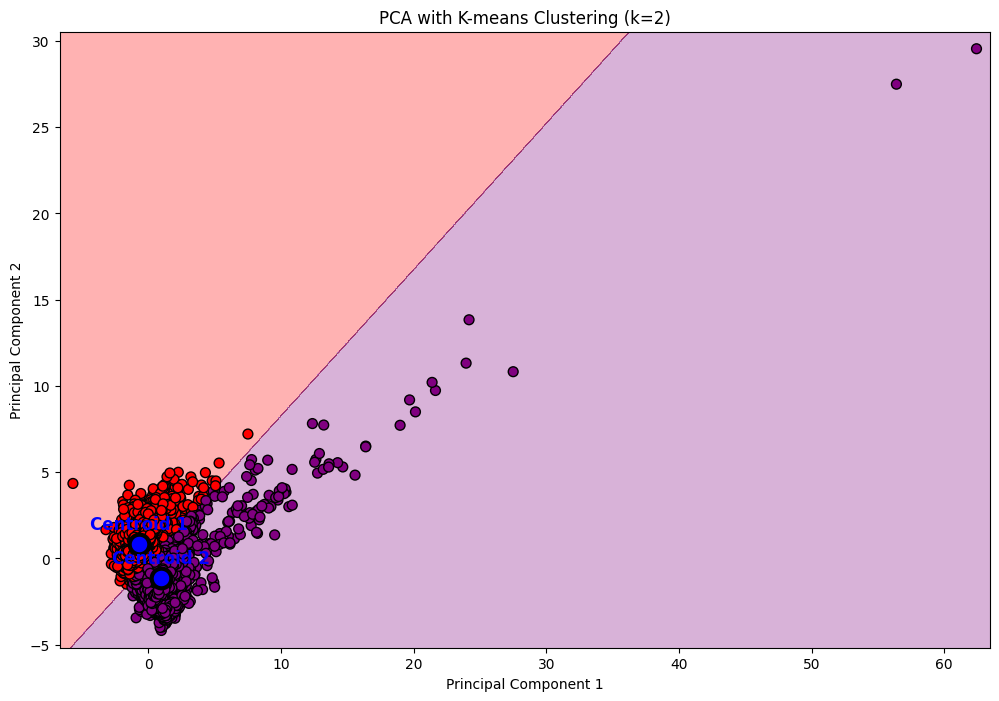

In [106]:
visualizeKMeans(california_housing,2)

- The plot shown here is dense around origin and density decreases with increase in x and y values.
- Cluster boundary very close due to the density of the points.

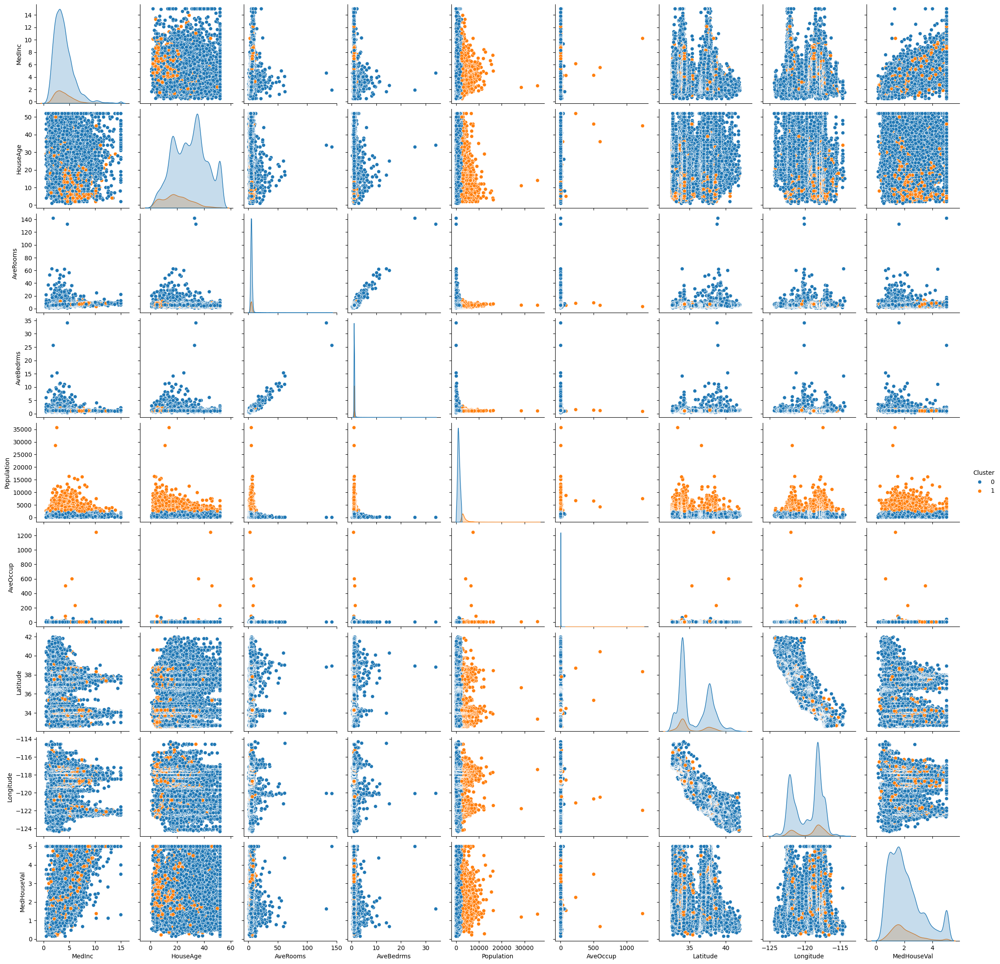

In [107]:
pairPlot(cluster_california)

- In this pair plot we can see the dominance of cluster 0 over cluster 1 in all the features.
- Based on population all the have a clear split, this shows the dominance of population column over the clustering.
- Apart from population, all the other features has mixture of cluster 0 and cluster 1 and the boundary is not visible.

#### Inference
- From k=2, we can see that cluster 0 is having more observations than cluster 1. 
- Population column has a high dominance in forming the boundary and this could be due to its high variance when compared with the other columns.

#### k=3

In [108]:
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans.fit(california_housing)
y_pred = kmeans.predict(california_housing)
cluster_california = california_housing.assign(Cluster = y_pred)
print(cluster_california["Cluster"].value_counts())
cluster0_california = cluster_california[cluster_california["Cluster"] == 0]
cluster1_california = cluster_california[cluster_california["Cluster"] == 1]
cluster2_california = cluster_california[cluster_california["Cluster"] == 2]

Cluster
0    14906
2     5228
1      506
Name: count, dtype: int64


Still, Cluster 0 is having more observation than any other clusters.

In [109]:
cluster0_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,14906.000000,14906.000000,14906.000000,14906.000000,14906.00000,14906.000000,14906.000000,14906.000000,14906.000000,14906.0
mean,3.896628,30.807594,5.538008,1.108290,943.41916,2.854685,35.765356,-119.683896,2.092304,0.0
std,1.970937,12.432474,2.789370,0.553846,380.16113,1.080907,2.180638,2.024171,1.207784,0.0
min,0.499900,1.000000,0.846154,0.333333,3.00000,0.692308,32.540000,-124.350000,0.149990,0.0
25%,2.551800,21.000000,4.530778,1.000000,678.00000,2.378190,33.940000,-121.880000,1.145250,0.0
50%,3.556200,32.000000,5.286961,1.046512,949.00000,2.743135,34.485000,-118.980000,1.809000,0.0
75%,4.777275,40.000000,6.092233,1.103069,1238.00000,3.174028,37.760000,-118.070000,2.713000,0.0
max,15.000100,52.000000,141.909091,34.066667,1643.00000,63.750000,41.950000,-114.310000,5.000010,0.0


In [110]:
cluster1_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.0
mean,4.153071,14.782609,5.465891,1.073841,6132.407115,7.376751,35.168794,-119.051206,2.007882,1.0
std,1.597201,9.190405,1.334041,0.074307,2524.281821,60.319362,1.940416,1.887933,0.910137,0.0
min,1.206500,2.000000,1.806122,0.833333,4240.000000,1.507302,32.550000,-122.670000,0.225000,1.0
25%,2.882450,7.000000,4.490416,1.029861,4713.500000,2.715345,33.892500,-121.280000,1.375250,1.0
50%,3.987750,14.000000,5.534866,1.057546,5376.000000,3.092436,34.150000,-118.295000,1.829500,1.0
75%,5.151425,20.750000,6.276516,1.097560,6900.750000,3.479923,37.365000,-117.582500,2.491250,1.0
max,10.226400,52.000000,9.524554,1.574288,35682.000000,1243.333333,41.610000,-116.060000,5.000010,1.0


In [111]:
cluster2_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.000000,5228.0
mean,3.769331,23.798967,5.114628,1.065769,2344.345065,3.269655,35.296062,-119.294308,2.006727,2.0
std,1.705312,11.004214,1.296009,0.100927,619.877382,8.313099,1.976524,1.919120,1.006207,0.0
min,0.499900,2.000000,1.654440,0.812261,1644.000000,1.312994,32.550000,-124.210000,0.379000,2.0
25%,2.572050,16.000000,4.205988,1.019121,1851.000000,2.604420,33.910000,-121.420000,1.300000,2.0
50%,3.426800,23.000000,5.022436,1.052415,2145.500000,3.019092,34.140000,-118.340000,1.776500,2.0
75%,4.618625,32.000000,5.926427,1.091859,2698.250000,3.559314,37.372500,-117.920000,2.487000,2.0
max,15.000100,52.000000,14.851852,2.851017,4225.000000,599.714286,41.860000,-114.580000,5.000010,2.0


**Inference**
- MedInc, AveBedrms, Latitude, Longitude, MedHouseVal are having similar stats among the three clusters
- HouseAge, AveOccup are having minimal change in their stats
- Population column is having a drastic change in its values
- In this case also, population column has a perfect boundary 

In [112]:
print("-"*20)
print("Cluster k=2 \n\nPopulation Column")
print("-"*20)
print("Cluster 1")
print("Minimum: ",cluster0_california["Population"].min())
print("Maximum: ",cluster0_california["Population"].max())
print("\nCluster 2")
print("Minimum: ",cluster1_california["Population"].min())
print("Maximum: ",cluster1_california["Population"].max())
print("\nCluster 3")
print("Minimum: ",cluster2_california["Population"].min())
print("Maximum: ",cluster2_california["Population"].max())

--------------------
Cluster k=2 

Population Column
--------------------
Cluster 1
Minimum:  3.0
Maximum:  1643.0

Cluster 2
Minimum:  4240.0
Maximum:  35682.0

Cluster 3
Minimum:  1644.0
Maximum:  4225.0


Here, we could see a clear split in the population between three clusters and thus even by incereasing number of clusters the feature dominance of population has not depricatted.

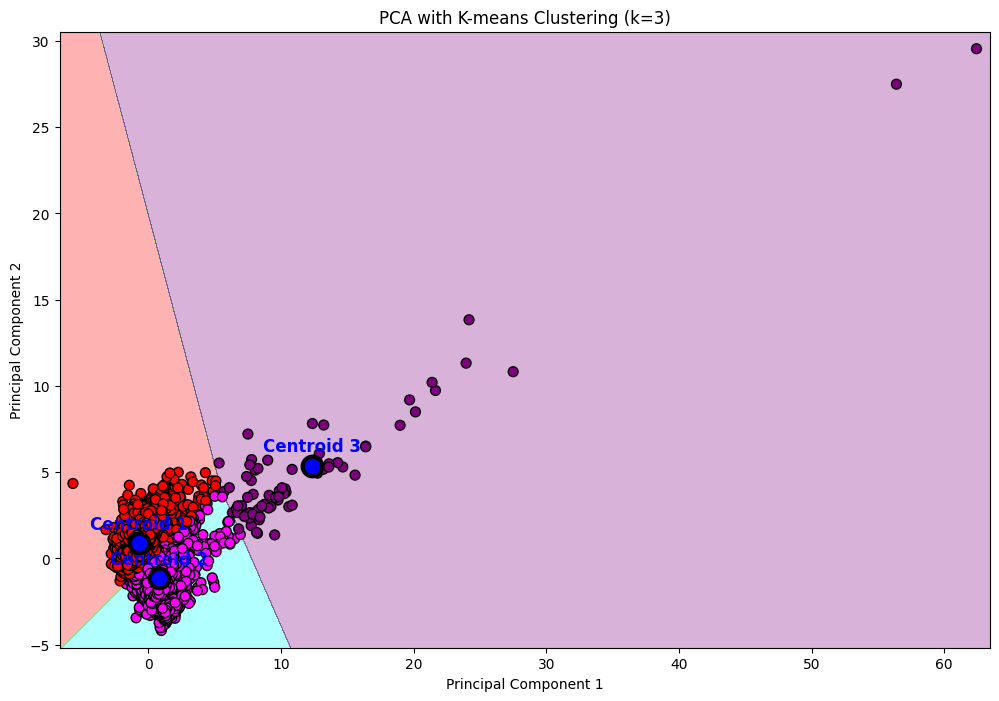

In [113]:
visualizeKMeans(california_housing,3)

- Cluster 0 and 1 captured the dense area and cluster 2 has captured the spare area.
- From the visualization, we can see that the Intercluster distance is very low and there points that has overlapping of points is observed.

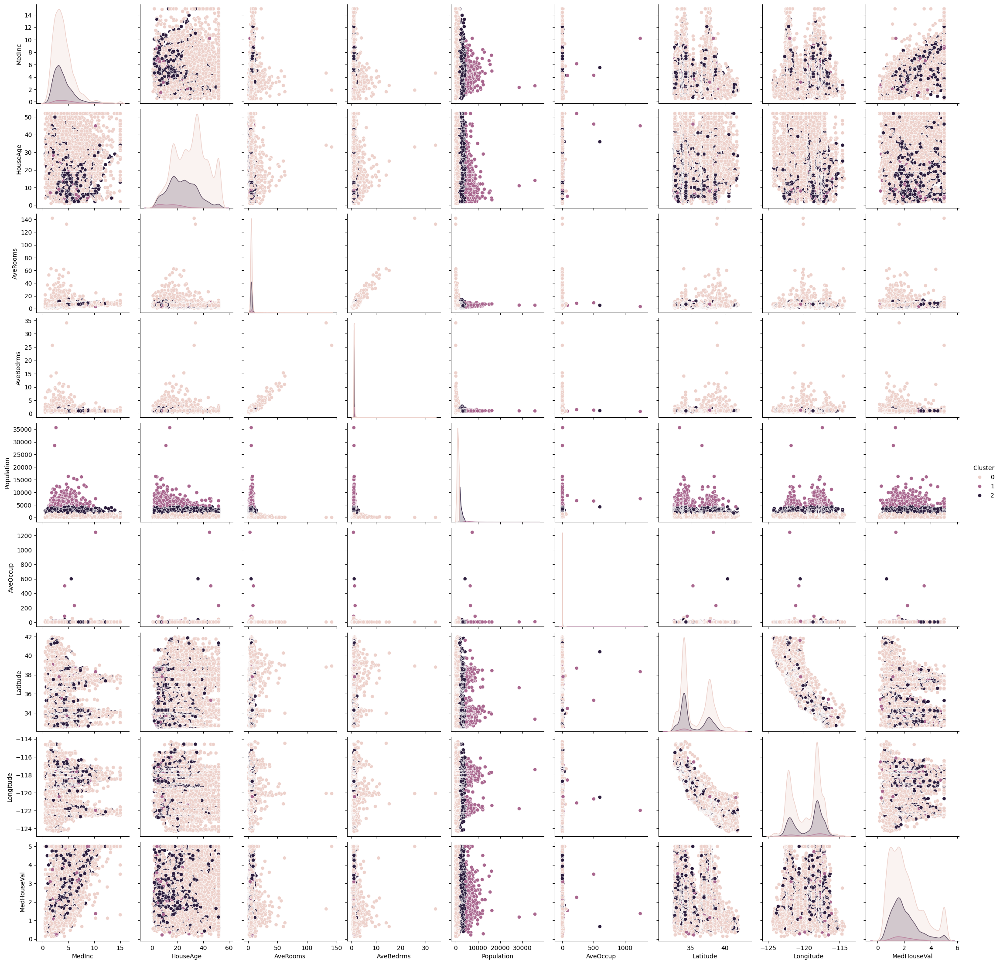

In [114]:
pairPlot(cluster_california)

### Inference
- Similar to the previous clustering, population column has displayed dominace over the clustering and all observations are majorly made into clusters based on this column.

#### k=4

In [115]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(california_housing)
y_pred = kmeans.predict(california_housing)
cluster_california = california_housing.assign(Cluster = y_pred)
print(cluster_california["Cluster"].value_counts())
cluster0_california = cluster_california[cluster_california["Cluster"] == 0]
cluster1_california = cluster_california[cluster_california["Cluster"] == 1]
cluster2_california = cluster_california[cluster_california["Cluster"] == 2]
cluster3_california = cluster_california[cluster_california["Cluster"] == 3]

Cluster
0    11282
2     7239
1     1883
3      236
Name: count, dtype: int64


In [116]:
cluster0_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,11282.000000,11282.000000,11282.000000,11282.000000,11282.000000,11282.000000,11282.000000,11282.000000,11282.000000,11282.0
mean,3.920532,31.626307,5.632629,1.122948,787.175855,2.797840,35.849892,-119.745082,2.112460,0.0
std,2.025433,12.543934,3.122359,0.631473,294.003928,0.898533,2.209014,2.041594,1.236227,0.0
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990,0.0
25%,2.533725,21.000000,4.576167,0.995609,597.000000,2.342530,33.950000,-121.920000,1.125000,0.0
50%,3.572400,33.000000,5.336414,1.045714,821.500000,2.696407,34.925000,-119.090000,1.813500,0.0
75%,4.809950,41.000000,6.133259,1.108464,1023.000000,3.111579,37.790000,-118.100000,2.750000,0.0
max,15.000100,52.000000,141.909091,34.066667,1248.000000,41.214286,41.950000,-114.310000,5.000010,0.0


In [117]:
cluster1_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.0
mean,3.841779,20.316516,5.123776,1.070031,3369.229421,3.603274,35.183330,-119.160850,2.015030,1.0
std,1.706634,10.214578,1.355795,0.094342,717.647158,13.820708,1.914426,1.906133,0.961492,0.0
min,0.499900,2.000000,1.654440,0.812261,2539.000000,1.384345,32.550000,-124.190000,0.404000,1.0
25%,2.610450,13.000000,4.156354,1.026536,2796.000000,2.641149,33.890000,-121.330000,1.369000,1.0
50%,3.534900,20.000000,5.081283,1.054248,3152.000000,3.060773,34.120000,-118.300000,1.786000,1.0
75%,4.732850,27.000000,5.986796,1.091887,3779.500000,3.616486,37.340000,-117.830000,2.460500,1.0
max,13.947000,52.000000,13.885901,2.851017,5525.000000,599.714286,41.810000,-114.590000,5.000010,1.0


In [118]:
cluster2_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,7239.000000,7239.000000,7239.000000,7239.000000,7239.000000,7239.000000,7239.000000,7239.000000,7239.000000,7239.0
mean,3.785369,26.664042,5.183481,1.063352,1710.110236,3.068538,35.422420,-119.418873,2.015049,2.0
std,1.743426,11.521062,1.253688,0.118383,339.651445,1.205324,2.037594,1.939823,1.068267,0.0
min,0.677500,2.000000,1.748287,0.813492,1248.000000,1.304534,32.550000,-124.300000,0.269000,2.0
25%,2.579100,17.000000,4.334989,1.012390,1422.000000,2.543532,33.920000,-121.510000,1.234000,2.0
50%,3.472200,26.000000,5.081553,1.050251,1642.000000,2.952255,34.180000,-118.400000,1.778000,2.0
75%,4.618500,35.000000,5.916838,1.092142,1947.000000,3.435187,37.480000,-117.970000,2.542000,2.0
max,15.000100,52.000000,21.805654,4.646643,2538.000000,63.750000,41.860000,-114.550000,5.000010,2.0


In [119]:
cluster3_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.000000,236.0
mean,4.334091,12.855932,5.660798,1.075421,7699.894068,11.927897,35.211992,-119.074492,2.038246,3.0
std,1.596827,8.954994,1.359685,0.079852,2990.219844,88.180989,1.946395,1.923176,0.910959,0.0
min,1.555300,2.000000,1.806122,0.833333,5534.000000,1.507302,32.650000,-122.580000,0.225000,3.0
25%,3.134075,5.000000,4.842733,1.030378,6162.500000,2.745356,33.927500,-121.392500,1.375750,3.0
50%,4.199500,11.000000,5.689992,1.056961,7058.500000,3.117879,34.190000,-118.330000,1.854000,3.0
75%,5.409500,17.000000,6.575398,1.101518,8038.250000,3.486057,37.372500,-117.452500,2.599250,3.0
max,10.226400,52.000000,9.524554,1.574288,35682.000000,1243.333333,40.550000,-116.140000,5.000010,3.0


In [120]:
print("-"*20)
print("Cluster k=2 \n\nPopulation Column")
print("-"*20)
print("Cluster 1")
print("Minimum: ",cluster0_california["Population"].min())
print("Maximum: ",cluster0_california["Population"].max())
print("\nCluster 2")
print("Minimum: ",cluster1_california["Population"].min())
print("Maximum: ",cluster1_california["Population"].max())
print("\nCluster 3")
print("Minimum: ",cluster2_california["Population"].min())
print("Maximum: ",cluster2_california["Population"].max())
print("\nCluster 4")
print("Minimum: ",cluster3_california["Population"].min())
print("Maximum: ",cluster3_california["Population"].max())

--------------------
Cluster k=2 

Population Column
--------------------
Cluster 1
Minimum:  3.0
Maximum:  1248.0

Cluster 2
Minimum:  2539.0
Maximum:  5525.0

Cluster 3
Minimum:  1248.0
Maximum:  2538.0

Cluster 4
Minimum:  5534.0
Maximum:  35682.0


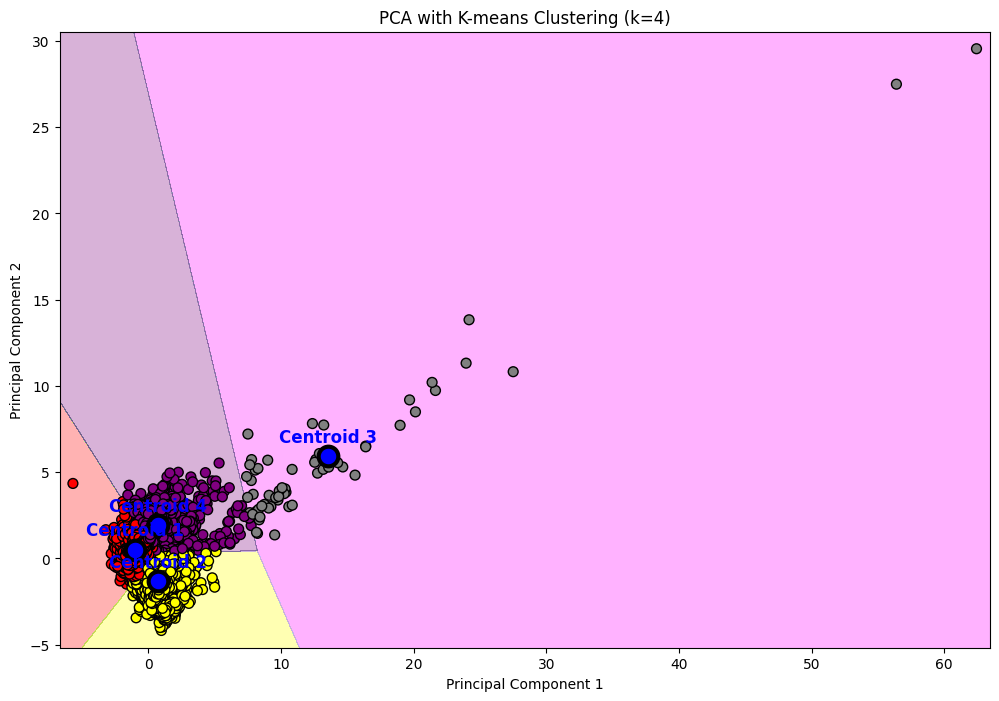

In [121]:
visualizeKMeans(california_housing,4)

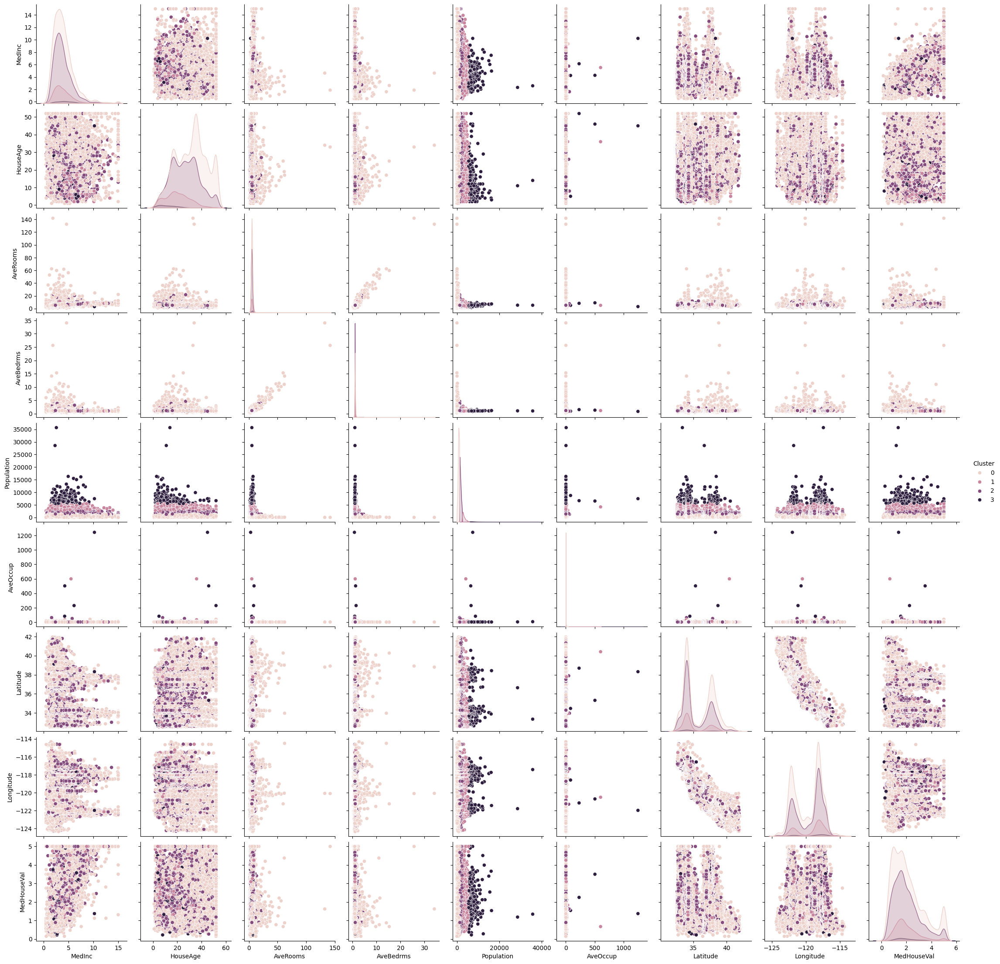

In [122]:
pairPlot(cluster_california)

### Inference
- Similar pattern is observed in the clustering which is dominated by the population column.
- Heavy Overlapping is observed in the dense area of the cluster plot.

#### k=5

In [123]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=42)
kmeans.fit(california_housing)
y_pred = kmeans.predict(california_housing)
cluster_california = california_housing.assign(Cluster = y_pred)
print(cluster_california["Cluster"].value_counts())
cluster0_california = cluster_california[cluster_california["Cluster"] == 0]
cluster1_california = cluster_california[cluster_california["Cluster"] == 1]
cluster2_california = cluster_california[cluster_california["Cluster"] == 2]
cluster3_california = cluster_california[cluster_california["Cluster"] == 3]
cluster4_california = cluster_california[cluster_california["Cluster"] == 4]

Cluster
0    11197
2     7257
1     1928
3      256
4        2
Name: count, dtype: int64


In [124]:
cluster0_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,11197.000000,11197.000000,11197.000000,11197.000000,11197.000000,11197.000000,11197.000000,11197.000000,11197.000000,11197.0
mean,3.919567,31.641958,5.635317,1.123506,783.710458,2.797308,35.852628,-119.746613,2.112125,0.0
std,2.024543,12.548497,3.132074,0.633805,292.404537,0.900007,2.210015,2.042086,1.236359,0.0
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990,0.0
25%,2.535000,21.000000,4.576923,0.995495,594.000000,2.342105,33.950000,-121.920000,1.125000,0.0
50%,3.571400,33.000000,5.338061,1.045767,818.000000,2.695332,34.940000,-119.100000,1.813000,0.0
75%,4.809800,41.000000,6.133588,1.108696,1018.000000,3.109718,37.790000,-118.100000,2.750000,0.0
max,15.000100,52.000000,141.909091,34.066667,1239.000000,41.214286,41.950000,-114.310000,5.000010,0.0


In [125]:
cluster1_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,1928.000000,1928.000000,1928.000000,1928.000000,1928.000000,1928.000000,1928.000000,1928.000000,1928.000000,1928.0
mean,3.844115,20.367220,5.126088,1.070211,3316.301349,3.582234,35.183480,-119.161234,2.017425,1.0
std,1.711599,10.207398,1.364945,0.097536,690.306056,13.658682,1.915742,1.906557,0.961927,0.0
min,0.499900,2.000000,1.654440,0.812261,2505.000000,1.384345,32.550000,-124.190000,0.404000,1.0
25%,2.607750,13.000000,4.153856,1.026218,2761.750000,2.635772,33.890000,-121.350000,1.371750,1.0
50%,3.525400,19.500000,5.084446,1.054172,3112.000000,3.057221,34.120000,-118.305000,1.788000,1.0
75%,4.748725,27.000000,5.980786,1.091137,3724.000000,3.599751,37.340000,-117.837500,2.469250,1.0
max,13.947000,52.000000,13.885901,2.851017,5303.000000,599.714286,41.810000,-114.590000,5.000010,1.0


In [126]:
cluster2_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,7257.000000,7257.000000,7257.000000,7257.000000,7257.000000,7257.000000,7257.000000,7257.000000,7257.000000,7257.0
mean,3.785894,26.751275,5.183696,1.063092,1697.140967,3.067123,35.426866,-119.424262,2.015573,2.0
std,1.746624,11.528917,1.250277,0.117523,333.696840,1.204385,2.038979,1.940335,1.070093,0.0
min,0.677500,2.000000,1.748287,0.813492,1240.000000,1.304534,32.560000,-124.300000,0.269000,2.0
25%,2.578700,17.000000,4.336100,1.012277,1413.000000,2.542601,33.920000,-121.520000,1.232000,2.0
50%,3.474100,26.000000,5.082544,1.049919,1631.000000,2.951515,34.180000,-118.410000,1.777000,2.0
75%,4.616100,35.000000,5.916859,1.092275,1932.000000,3.434466,37.480000,-117.970000,2.544000,2.0
max,15.000100,52.000000,21.805654,4.646643,2504.000000,63.750000,41.860000,-114.550000,5.000010,2.0


In [127]:
cluster3_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.0
mean,4.346439,13.269531,5.641021,1.074902,7314.082031,11.250094,35.168867,-119.030977,2.056391,3.0
std,1.632347,9.118480,1.366839,0.077661,1938.341382,84.684985,1.920065,1.906718,0.948213,0.0
min,1.555300,2.000000,1.806122,0.833333,5325.000000,1.507302,32.650000,-122.580000,0.225000,3.0
25%,3.118050,6.000000,4.761013,1.031011,5977.500000,2.745356,33.927500,-121.350000,1.375750,3.0
50%,4.184350,11.500000,5.685560,1.055413,6841.500000,3.110701,34.175000,-118.300000,1.854000,3.0
75%,5.385725,18.000000,6.580828,1.101238,7740.500000,3.486057,37.347500,-117.467500,2.609500,3.0
max,10.226400,52.000000,9.524554,1.574288,16305.000000,1243.333333,40.550000,-116.140000,5.000010,3.0


In [128]:
cluster4_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,2.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.0
mean,2.440800,12.50000,5.317508,1.035084,32124.000000,6.089441,34.995000,-119.605000,1.266000,4.0
std,0.186818,2.12132,0.066483,0.034790,5031.771855,1.969477,2.326381,3.090057,0.110309,0.0
min,2.308700,11.00000,5.270497,1.010484,28566.000000,4.696810,33.350000,-121.790000,1.188000,4.0
25%,2.374750,11.75000,5.294002,1.022784,30345.000000,5.393126,34.172500,-120.697500,1.227000,4.0
50%,2.440800,12.50000,5.317508,1.035084,32124.000000,6.089441,34.995000,-119.605000,1.266000,4.0
75%,2.506850,13.25000,5.341013,1.047384,33903.000000,6.785756,35.817500,-118.512500,1.305000,4.0
max,2.572900,14.00000,5.364518,1.059684,35682.000000,7.482072,36.640000,-117.420000,1.344000,4.0


In [129]:
print("-"*20)
print("Cluster k=2 \n\nPopulation Column")
print("-"*20)
print("Cluster 1")
print("Minimum: ",cluster0_california["Population"].min())
print("Maximum: ",cluster0_california["Population"].max())
print("\nCluster 2")
print("Minimum: ",cluster1_california["Population"].min())
print("Maximum: ",cluster1_california["Population"].max())
print("\nCluster 3")
print("Minimum: ",cluster2_california["Population"].min())
print("Maximum: ",cluster2_california["Population"].max())
print("\nCluster 4")
print("Minimum: ",cluster3_california["Population"].min())
print("Maximum: ",cluster3_california["Population"].max())
print("\nCluster 5")
print("Minimum: ",cluster4_california["Population"].min())
print("Maximum: ",cluster4_california["Population"].max())

--------------------
Cluster k=2 

Population Column
--------------------
Cluster 1
Minimum:  3.0
Maximum:  1239.0

Cluster 2
Minimum:  2505.0
Maximum:  5303.0

Cluster 3
Minimum:  1240.0
Maximum:  2504.0

Cluster 4
Minimum:  5325.0
Maximum:  16305.0

Cluster 5
Minimum:  28566.0
Maximum:  35682.0


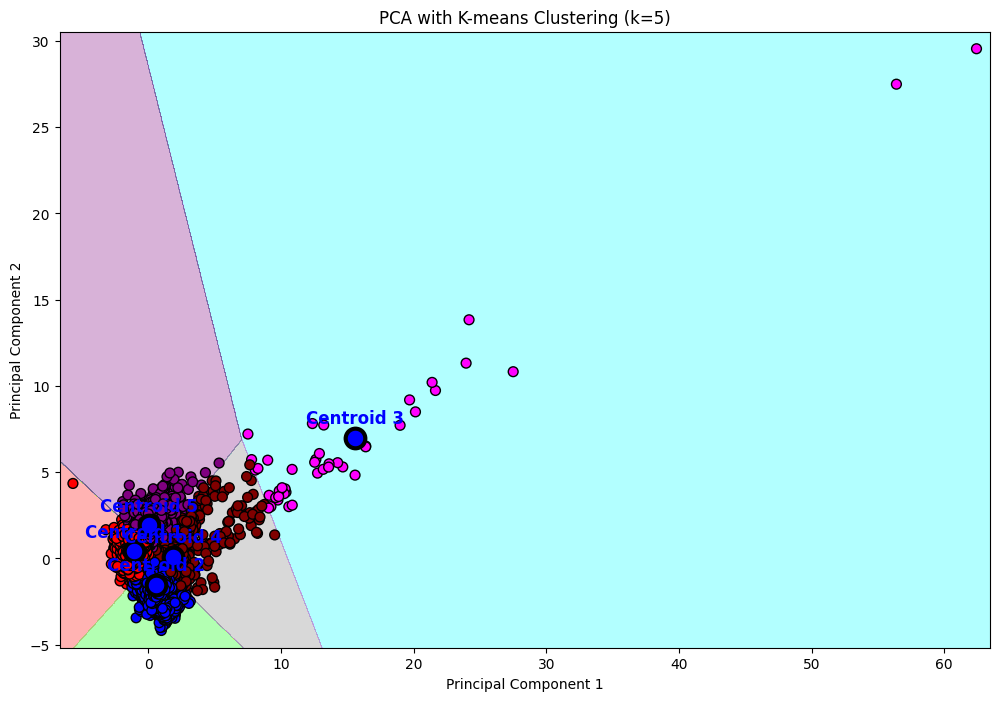

In [130]:
visualizeKMeans(california_housing,5)

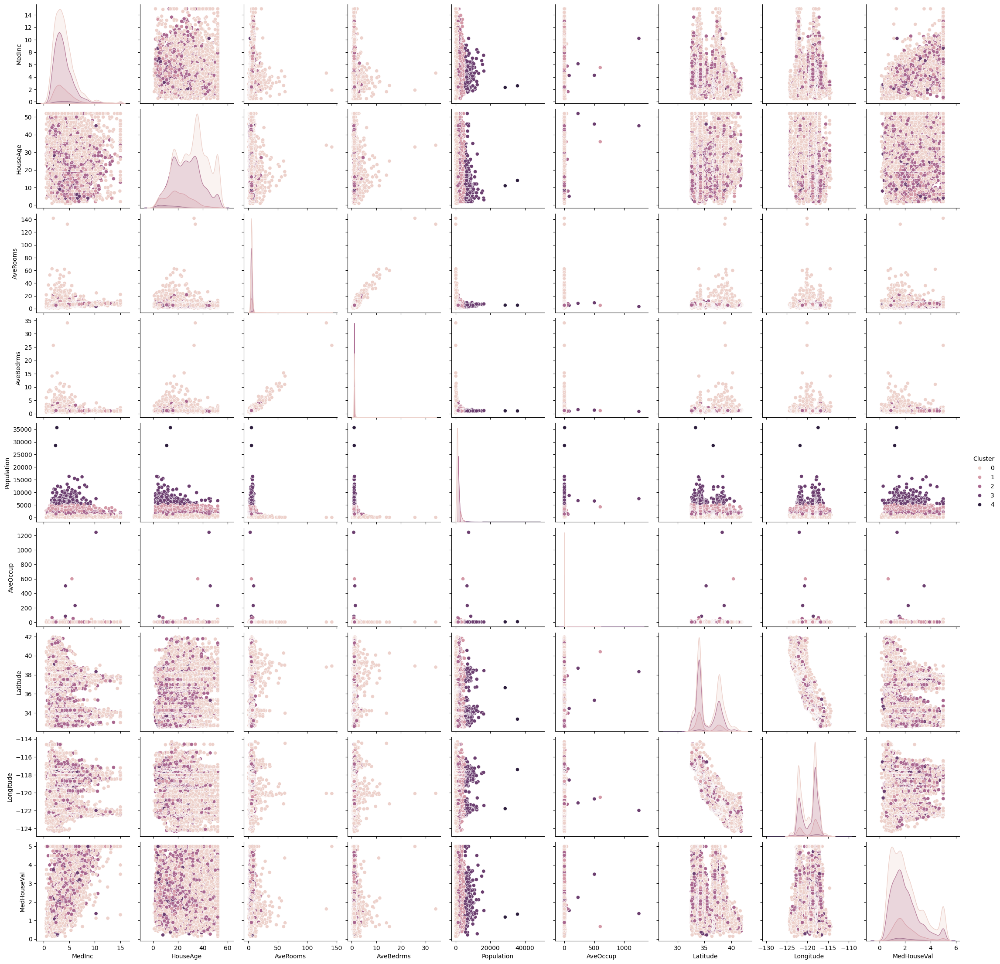

In [131]:
pairPlot(cluster_california)

### Inference
- Population column has again has the dominance in creating the boundries.
- Cluster 4 is having only 2 data points which makes this clustering number as inappropriate for this dataset.

### Standardizing Data

Since the population column is having a high variance, it has a high dominance in forming the cluster. To reduce this dependency feature scaling can be used. Additionally, KMeans Clustering technique uses Eucledian distance to form clusters and thus standardizing data which has multiple scales and measuring units would be optimal.

In [132]:
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(california_housing),columns=['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup',
       'Latitude', 'Longitude', 'MedHouseVal'])
X_scaled.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04,2.064000e+04
mean,6.609700e-17,5.508083e-18,6.609700e-17,-1.060306e-16,-1.101617e-17,3.442552e-18,-1.079584e-15,-8.526513e-15,2.037991e-16
std,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,-1.774299e+00,-2.196180e+00,-1.852319e+00,-1.610768e+00,-1.256123e+00,-2.290000e-01,-1.447568e+00,-2.385992e+00,-1.662641e+00
25%,-6.881186e-01,-8.453931e-01,-3.994496e-01,-1.911716e-01,-5.638089e-01,-6.171062e-02,-7.967887e-01,-1.113209e+00,-7.561633e-01
50%,-1.767951e-01,2.864572e-02,-8.078489e-02,-1.010650e-01,-2.291318e-01,-2.431585e-02,-6.422871e-01,5.389137e-01,-2.353337e-01
75%,4.593063e-01,6.643103e-01,2.519615e-01,6.015869e-03,2.644949e-01,2.037453e-02,9.729566e-01,7.784964e-01,5.014973e-01
max,5.858286e+00,1.856182e+00,5.516324e+01,6.957171e+01,3.025033e+01,1.194191e+02,2.958068e+00,2.625280e+00,2.540411e+00


In [133]:
kmeans = KMeans(n_clusters=2, init='k-means++', random_state=42)
kmeans.fit(X_scaled)
y_pred = kmeans.predict(X_scaled)
cluster_california = X_scaled.assign(Cluster = y_pred)
print(cluster_california["Cluster"].value_counts())
cluster0_california = cluster_california[cluster_california["Cluster"] == 0]
cluster1_california = cluster_california[cluster_california["Cluster"] == 1]

Cluster
0    11813
1     8827
Name: count, dtype: int64


The ratio between the clusters has decreased.

In [134]:
cluster0_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,11813.000000,11813.000000,11813.000000,11813.000000,11813.000000,11813.000000,11813.000000,11813.000000,11813.000000,11813.0
mean,0.035490,-0.013165,-0.081702,-0.043856,0.096602,0.012606,-0.803199,0.787193,0.075036,0.0
std,1.016223,0.956675,0.638930,0.458494,1.082490,1.191811,0.279040,0.367884,0.980047,0.0
min,-1.774299,-2.196180,-1.852319,-1.610768,-1.256123,-0.223445,-1.447568,-1.203053,-1.662641,0.0
25%,-0.665116,-0.765935,-0.471472,-0.191749,-0.508177,-0.056442,-0.871699,0.613783,-0.601041,0.0
50%,-0.142107,0.028646,-0.141317,-0.102516,-0.157604,-0.013162,-0.773379,0.733575,-0.170338,0.0
75%,0.504706,0.664310,0.217272,0.000445,0.372227,0.035819,-0.703151,0.988131,0.526412,0.0
max,5.858286,1.856182,12.380843,12.680720,30.250330,119.419103,1.258550,2.625280,2.540411,0.0


In [135]:
cluster1_california.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,Cluster
count,8827.000000,8827.000000,8827.000000,8827.000000,8827.000000,8827.000000,8827.000000,8827.000000,8827.000000,8827.0
mean,-0.047495,0.017619,0.109340,0.058691,-0.129280,-0.016870,1.074905,-1.053485,-0.100419,1.0
std,0.975966,1.055053,1.330906,1.432197,0.860883,0.661122,0.464032,0.466984,1.017585,0.0
min,-1.774299,-2.196180,-1.737416,-1.376306,-1.251707,-0.229000,-0.778061,-2.385992,-1.662641,1.0
25%,-0.712911,-0.845393,-0.290433,-0.190297,-0.630038,-0.066485,0.813773,-1.347800,-0.926018,1.0
50%,-0.225485,-0.050812,-0.015206,-0.099277,-0.319203,-0.035442,1.005730,-1.178096,-0.374857,1.0
75%,0.409011,0.743768,0.288185,0.014504,0.128063,0.001148,1.310051,-0.848670,0.473549,1.0
max,5.858286,1.856182,55.163236,69.571713,13.139410,57.448030,2.958068,2.535437,2.540411,1.0


**Inference**
- All the columns are having changes among the cluster
- The dominance of population has also reduced

In [136]:
print("-"*20)
print("Cluster k=2 \n\nPopulation Column")
print("-"*20)
print("Cluster 1")
print("Minimum: ",cluster0_california["Population"].min())
print("Maximum: ",cluster0_california["Population"].max())
print("\nCluster 2")
print("Minimum: ",cluster1_california["Population"].min())
print("Maximum: ",cluster1_california["Population"].max())

--------------------
Cluster k=2 

Population Column
--------------------
Cluster 1
Minimum:  -1.2561225469018058
Maximum:  30.250330218731502

Cluster 2
Minimum:  -1.2517072812321355
Maximum:  13.139409642491232


Here, we could see a clear split in the population between three clusters and thus even by incereasing number of clusters the feature dominance of population has not depricatted.

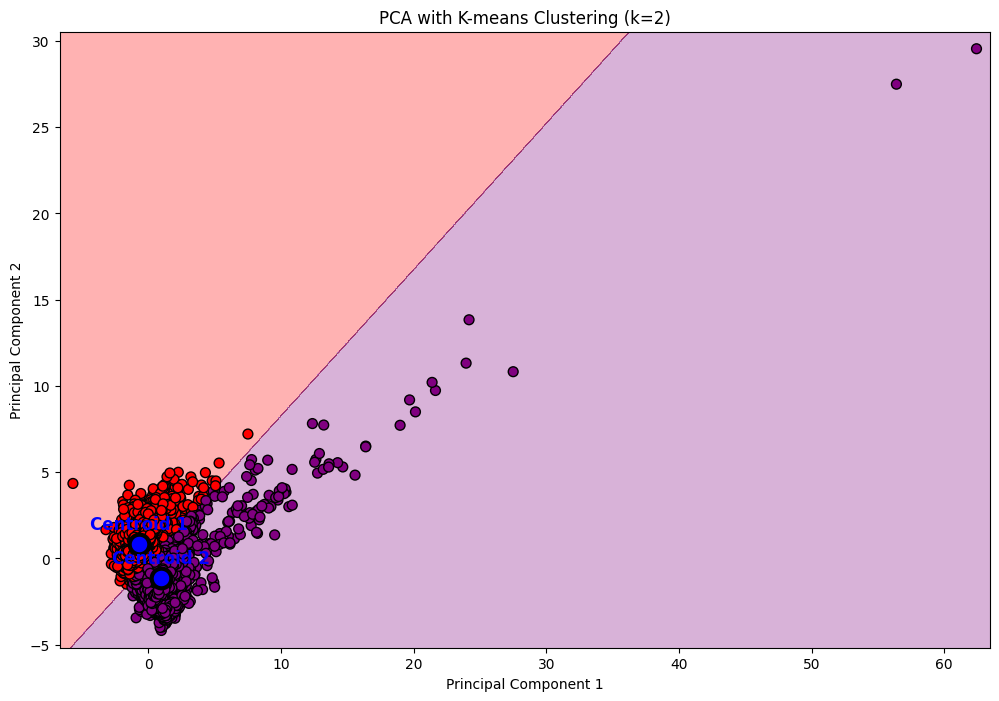

In [137]:
visualizeKMeans(X_scaled,2)

- Cluster 0 and 1 captured the dense area and cluster 2 has captured the spare area.
- From the visualization, we can see that the Intercluster distance is very low and there points that has overlapping of points is observed.

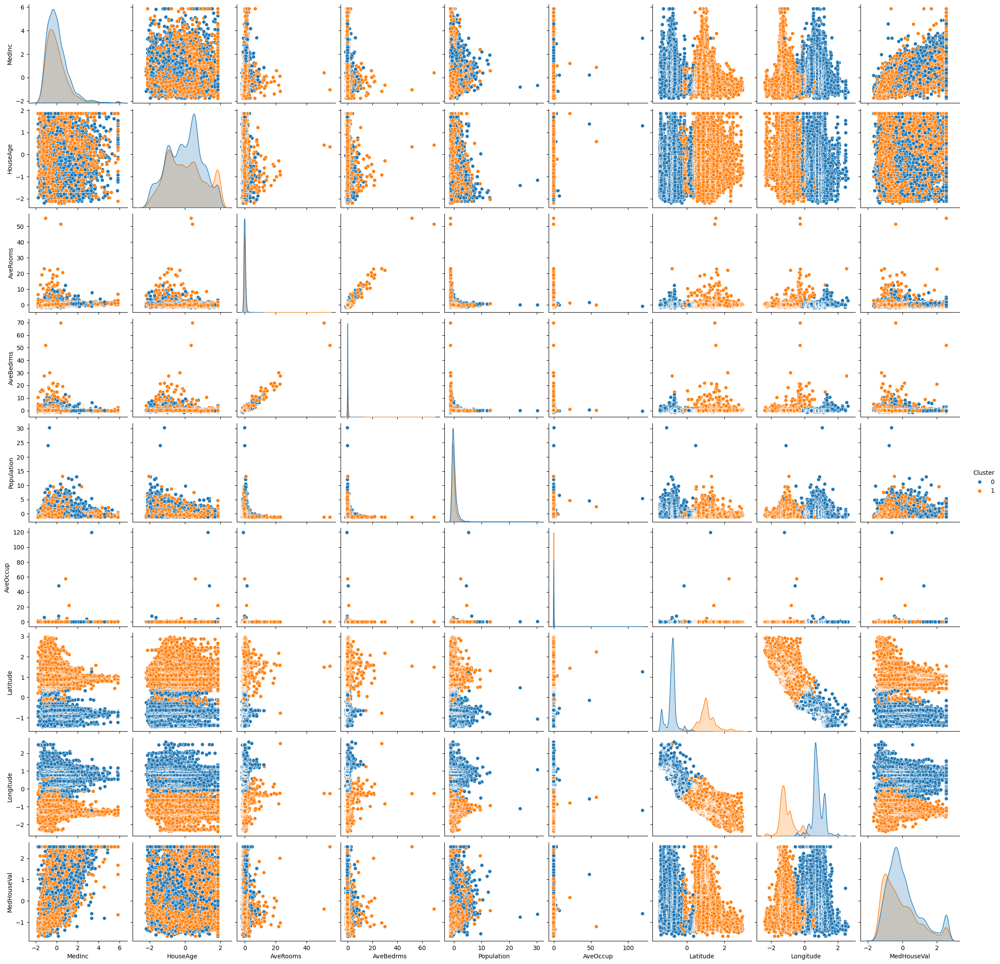

In [138]:
pairPlot(cluster_california)

**Inference**
- From the pairplot we can see that the lattitude and logitude are dominated the most in creating the cluster.
- Standardizing has reduced the depency of one column population.
- This verifies that standardizing the data has significant impact on the clustering.

## Conclusion
- Maximum deflection from the elbow method, could provide us the optimal cluster number.
- Whereas, in this analysis we saw silhoutte analysis giving a different cluster number from the elbow method.
- Initially, population which had highest variance became the dominating feature to create the cluster.
- This shows that KMeans Clustering is more prone to the variance of the features.
- Standardizing the data has effects in the data and the clustering.
- When standardized, the variance of population got reduced and the clustering didn't happen based on it.
- Pair plot of standardized data shown us the clustering has happened based on lattitude and longitude.
- Thus, we have analysed the KMeans clustering method and the clusters which we obtained from it.